In [ ]:
!nvidia-smi

Fri Nov  8 09:49:12 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   59C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
! pip install wldhx.yadisk-direct

In [ ]:
!curl -L $(yadisk-direct https://disk.yandex.com/d/jJrOLbYlBYVESQ) -o lyft_segmentation.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:--  0:00:01 --:--:--     0
100 2620M  100 2620M    0     0  20.3M      0  0:02:08  0:02:08 --:--:-- 19.4M


In [ ]:
! unzip -qq lyft_segmentation.zip

In [ ]:
import os
import random
import cv2
import numpy as np
import torch
import shutil
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score, f1_score
#from ultralytics import YOLO
from google.colab.patches import cv2_imshow

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os

# Путь к маске
mask_path = '/content/lyft_segmentation/segmentation_masks/02_00_000.png'
#target_size = (640, 640)
mask = cv2.imread(mask_path)
#mask = cv2.resize(mask, target_size, interpolation=cv2.INTER_NEAREST)
# # Считываем маску
# mask = plt.imread(mask_path)

# # Масштабируем значения маски от 0 до 255 и приводим к типу uint8
#mask = (mask * 255).astype(np.uint8)
#####################
# # # Получаем первую компоненту, так как маска, скорее всего, в трех каналах
# # mask = mask[:,:,0]

# # Путь для сохранения маски в папке "test"
# output_mask_dir = '/content/lyft_segmentation/test'
# os.makedirs(output_mask_dir, exist_ok=True)

# # Сохраняем маску
# output_mask_path = os.path.join(output_mask_dir, '02_00_000_resized.png')
# plt.imsave(output_mask_path, mask)

# print(f"Маска сохранена в {output_mask_path}")


Маска сохранена в /content/lyft_segmentation/test/02_00_000_resized.png


In [ ]:
!pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 881.2/881.2 kB 26.6 MB/s eta 0:00:00


In [ ]:
from ultralytics.data.converter import convert_segment_masks_to_yolo_seg

# The classes here is the total classes in the dataset, for COCO dataset we have 80 classes
convert_segment_masks_to_yolo_seg("/content/lyft_segmentation/test", "/content/lyft_segmentation/test_yolo", classes=14)

Processing /content/lyft_segmentation/test/02_00_000_resized.png imgsz = 600 x 800
Processed and stored at /content/lyft_segmentation/test_yolo/02_00_000_resized.txt imgsz = 600 x 800


In [ ]:
import numpy as np
import cv2

mask_path = "/content/lyft_segmentation/test/02_00_000_resized.png"
mask = cv2.imread(mask_path, cv2.IMREAD_UNCHANGED)
print(np.unique(mask))  # Выведет все уникальные классы в маске


[  0   1   2   3   5   6   7   8   9  10  11  12 255]


In [ ]:
import cv2
import os
import numpy as np
from pathlib import Path

input_images_dir = "/content/lyft_segmentation/images"
input_masks_dir = "/content/lyft_segmentation/segmentation_masks"
output_base_dir = "/content/lyft_segmentation_resized"  # Корневая папка для измененных данных
output_images_dir = os.path.join(output_base_dir, "images")
output_masks_dir = os.path.join(output_base_dir, "segmentation_masks")
target_size = (640, 640)

# Создаем папки для сохранения измененных изображений и масок
Path(output_images_dir).mkdir(parents=True, exist_ok=True)
Path(output_masks_dir).mkdir(parents=True, exist_ok=True)

for img_name in os.listdir(input_images_dir):
    # Изменение размера изображений
    img_path = os.path.join(input_images_dir, img_name)
    img = cv2.imread(img_path)
    resized_img = cv2.resize(img, target_size, interpolation=cv2.INTER_LINEAR)
    cv2.imwrite(os.path.join(output_images_dir, img_name), resized_img)

    # Изменение размера масок
    mask_path = os.path.join(input_masks_dir, img_name)
    mask = cv2.imread(mask_path, cv2.IMREAD_UNCHANGED)

    # Умножаем маску на 255 для преобразования в значения принадлежности к классу
    mask = mask * 255

    # Для каждой маски выполняем установку 255 для конкретного класса и 0 для остальных
    # Предположим, что мы хотим обрабатывать каждый класс индивидуально

        # Сохраняем обработанную маску
        cv2.imwrite(os.path.join(output_masks_dir, img_name), mask_class)

print("Измененные изображения и маски сохранены в lyft_segmentation_resized.")


In [ ]:
import zipfile
import os

# Путь к архиву labels (2)
zip_file_path = '//content/labels (3).zip'  # Замените на актуальный путь к архиву
extract_folder = '/content/lyft_segmentation/labels'  # Папка, куда нужно распаковать архив

# Создаем папку 'labels', если она еще не существует
os.makedirs(extract_folder, exist_ok=True)

# Проверим, существует ли архив
if os.path.exists(zip_file_path):
    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
        zip_ref.extractall(extract_folder)
    print(f"Архив {zip_file_path} успешно распакован в {extract_folder}")
else:
    print(f"Архив по пути {zip_file_path} не найден!")


Архив //content/labels (3).zip успешно распакован в /content/lyft_segmentation/labels


In [ ]:
# Устанавливаем библиотеку gdown для скачивания файлов из Google Drive
!pip install -q gdown tqdm

# ID файла из ссылки на Google Drive
file_id = "1OiSL1cGkhr88sYHKDBtsW8QI9bTS1P_r"

# Скачиваем файл в текущую директорию
!gdown --id {file_id} -O dataset.zip

# Создаем папку lyft_segmentation/labels, если она не существует
import os
import zipfile
from tqdm import tqdm

labels_dir = "lyft_segmentation/labels"
os.makedirs(labels_dir, exist_ok=True)

# Распаковываем архив в папку labels с отображением прогресс-бара
with zipfile.ZipFile("dataset.zip", "r") as zip_ref:
    total_files = len(zip_ref.infolist())
    with tqdm(total=total_files, desc="Распаковка", unit="файл") as pbar:
        for file in zip_ref.infolist():
            zip_ref.extract(file, labels_dir)
            pbar.update(1)

print("Скачивание и распаковка завершены в папку lyft_segmentation/labels!")


/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1OiSL1cGkhr88sYHKDBtsW8QI9bTS1P_r
From (redirected): https://drive.google.com/uc?id=1OiSL1cGkhr88sYHKDBtsW8QI9bTS1P_r&confirm=t&uuid=8e82d6fa-0b56-4f65-bc98-b2c2df9b17cc
To: /content/dataset.zip
100% 1.83G/1.83G [00:23<00:00, 76.9MB/s]


Распаковка: 100%|██████████| 5000/5000 [02:05<00:00, 39.76файл/s]

Скачивание и распаковка завершены в папку lyft_segmentation/labels!


In [ ]:
image = cv2.imread('./lyft_segmentation/images/02_00_000.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

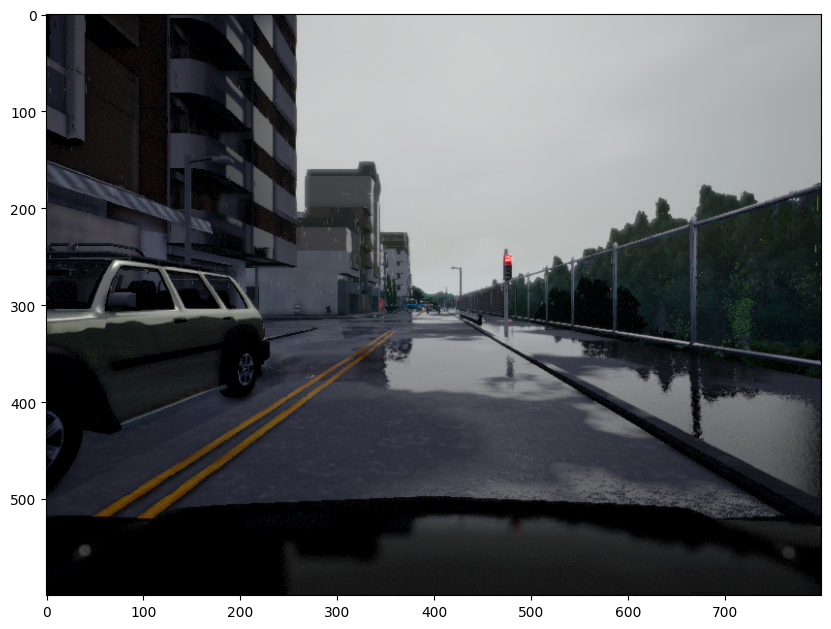

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(image)
plt.axis('on')
plt.show()

In [ ]:
img_seg = plt.imread('./lyft_segmentation/segmentation_masks/02_00_000.png')

print(img_seg[599][799][0])

0.039215688


Контуры не найдены для класса 1
Контуры не найдены для класса 2
Контуры не найдены для класса 3
Контуры не найдены для класса 4
Контуры не найдены для класса 5
Контуры не найдены для класса 6
Контуры не найдены для класса 7
Контуры не найдены для класса 8
Контуры не найдены для класса 9
Контуры не найдены для класса 10
Контуры не найдены для класса 11
Контуры не найдены для класса 12


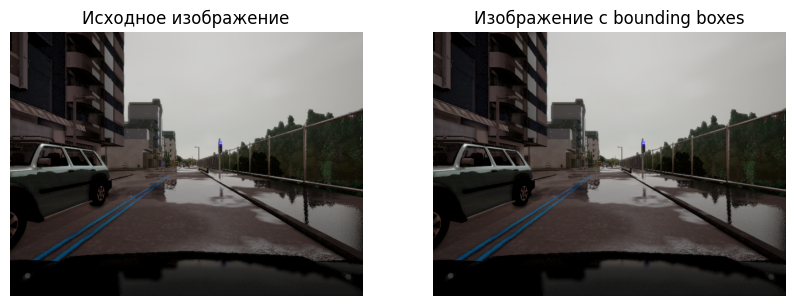

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Путь к маске и изображению
img_seg_path = './lyft_segmentation/segmentation_masks/02_00_000.png'
img_path = './lyft_segmentation/images/02_00_000.png'  # Убедитесь, что это путь к исходному изображению

# Загрузка изображения и маски
img_seg = plt.imread(img_seg_path)
original_img = plt.imread(img_path)

# Если изображение цветное, преобразуем в оттенки серого
if img_seg.ndim == 3 and img_seg.shape[2] == 3:
    img_seg = img_seg[:, :, 0]

# Создаем изображение для визуализации
visualization_img = original_img.copy()

# Перебираем все классы, кроме фона (предполагаем, что фон — класс 0)
for class_id in range(1, 13):
    # Создаем бинарную маску для текущего класса
    mask = np.where(img_seg == class_id, 255, 0).astype(np.uint8)

    # Находим контуры объектов
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Отладочная информация
    if contours:
        print(f"Найденные контуры для класса {class_id}: {len(contours)}")
        # Объединяем все контуры текущего класса в один
        combined_contour = np.vstack(contours)

        # Вычисляем bounding box, охватывающий все контуры
        x, y, w, h = cv2.boundingRect(combined_contour)

        # Рисуем bounding box на исходном изображении
        cv2.rectangle(visualization_img, (x, y), (x + w, y + h), (0, 255, 0), 2)  # Зеленый цвет

        # Добавляем текст класса на изображение
        cv2.putText(visualization_img, str(class_id), (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    else:
        print(f"Контуры не найдены для класса {class_id}")

# Отображаем оригинальное изображение
plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Исходное изображение')

# Отображаем изображение с bounding boxes
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(visualization_img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Изображение с bounding boxes')

plt.show()


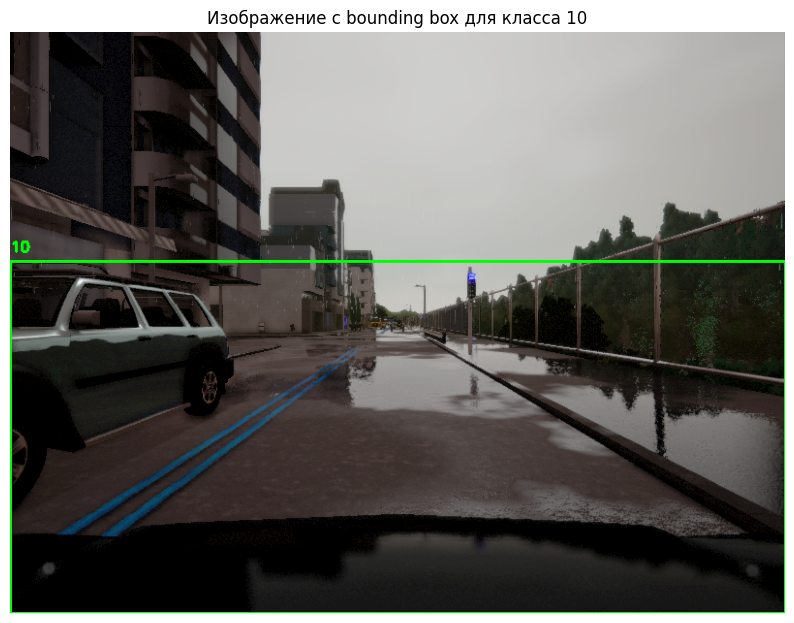

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Путь к файлу аннотации и изображению
annotation_path = './lyft_segmentation/annotations/02_00_000.txt'  # Убедитесь, что это путь к файлу аннотации
img_path = './lyft_segmentation/images/02_00_000.png'

# Загрузка изображения
original_img = plt.imread(img_path)

# Создаем изображение для визуализации
visualization_img = original_img.copy()

# Читаем аннотации из файла
with open(annotation_path, 'r') as f:
    lines = f.readlines()

# Параметры изображения
img_height, img_width, _ = original_img.shape

# Обрабатываем каждую строку в файле аннотации
for line in lines:
    class_id, x_center, y_center, width, height = map(float, line.strip().split())

    # Преобразуем координаты из нормализованного формата в пиксели
    x_center *= img_width
    y_center *= img_height
    width *= img_width
    height *= img_height

    # Вычисляем верхний левый угол и нижний правый угол для bounding box
    x1 = int(x_center - width / 2)
    y1 = int(y_center - height / 2)
    x2 = int(x_center + width / 2)
    y2 = int(y_center + height / 2)

    # Рисуем bounding box на изображении
    cv2.rectangle(visualization_img, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Зеленый цвет

    # Добавляем текст класса на изображение
    cv2.putText(visualization_img, str(int(class_id)), (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

# Отображаем оригинальное изображение
plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Исходное изображение')

# Отображаем изображение с bounding boxes
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(visualization_img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Изображение с bounding boxes из аннотации')

plt.show()


In [ ]:
%pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics 8.3.27 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 37.5/112.6 GB disk)


In [ ]:
import cv2
import numpy as np
from ultralytics import YOLO
import matplotlib.pyplot as plt


model = YOLO('yolov8x-seg.pt')


image_path = '/content/lyft_segmentation/images/02_00_000.png'

image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
h_or, w_or = image.shape[:2]

image_resized = cv2.resize(image, (640, 640))

results = model(image_resized)


100%|██████████| 137M/137M [00:01<00:00, 96.2MB/s]



0: 640x640 1 car, 1 truck, 1 traffic light, 121.2ms
Speed: 2.8ms preprocess, 121.2ms inference, 1994.0ms postprocess per image at shape (1, 3, 640, 640)


[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chai

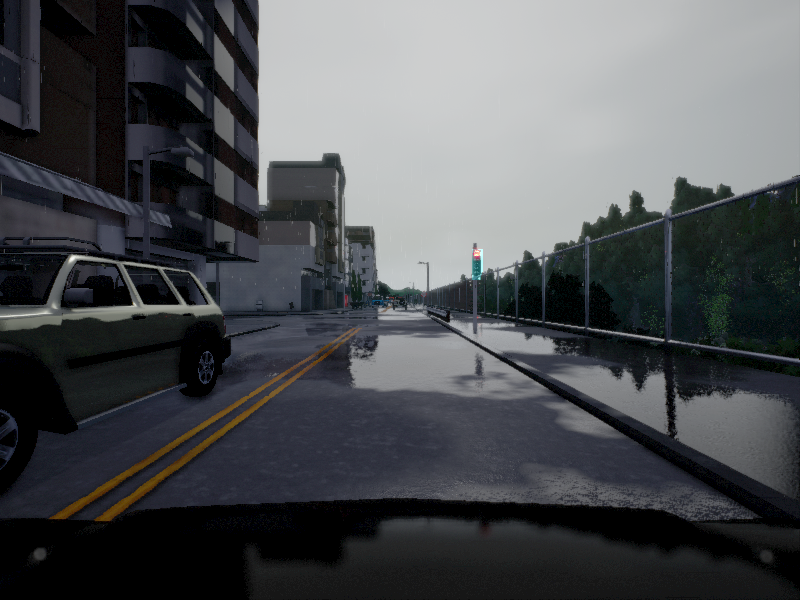

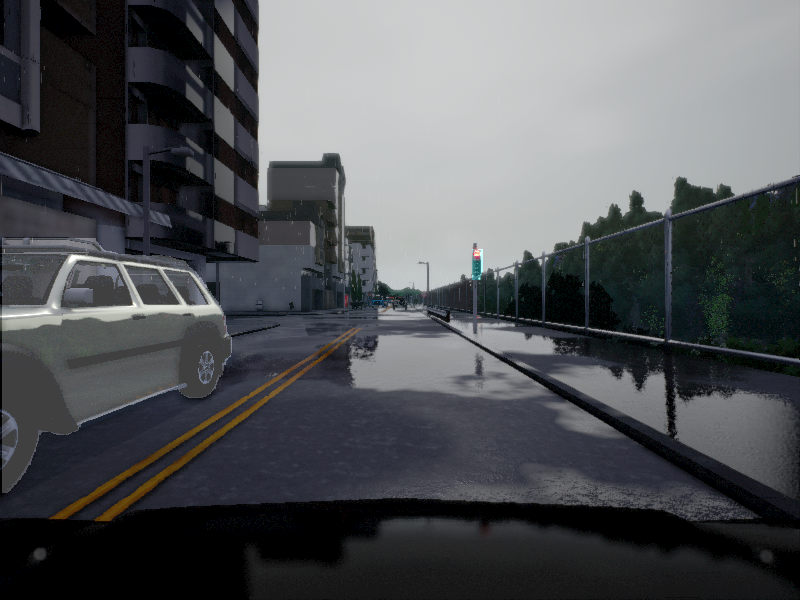

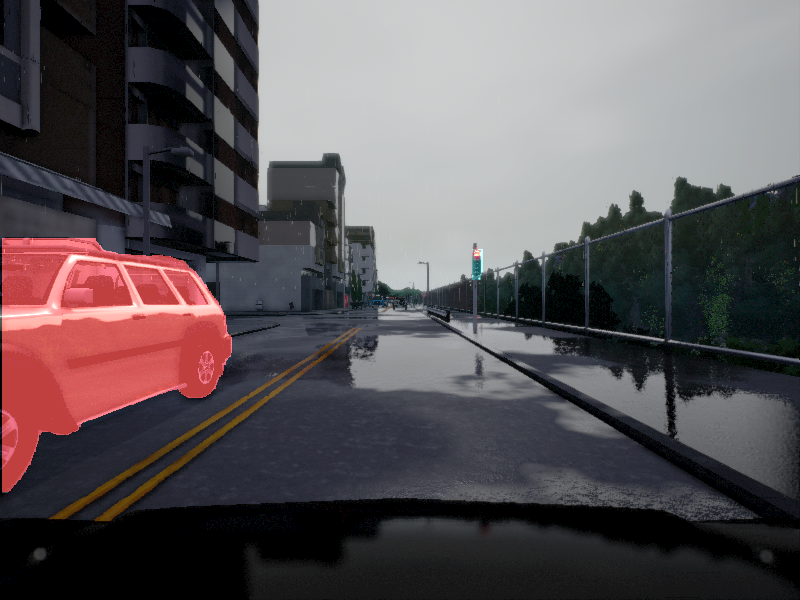

In [ ]:
# Цвета для масок
import cv2
from google.colab.patches import cv2_imshow
colors = [
    (255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0), (0, 255, 255),
    (255, 0, 255), (192, 192, 192), (128, 128, 128), (128, 0, 0), (128, 128, 0),
    (0, 128, 0), (128, 0, 128), (0, 128, 128), (0, 0, 128), (72, 61, 139),
    (47, 79, 79), (47, 79, 47), (0, 206, 209), (148, 0, 211), (255, 20, 147)
]
print(results)

results = model(image)
for result in results:
    masks = result.masks.data
    classes = result.boxes.cls
    scores = result.boxes.conf

print(f' {classes}, classes\n {scores}scores')
results = model(image_resized)[0]
classes_names = results.names
classes = results.boxes.cls.cpu().numpy()
masks = results.masks.data.cpu().numpy()

# Наложение масок на изображение
for i, mask in enumerate(masks):
    color = colors[int(classes[i]) % len(colors)]


    mask_resized = cv2.resize(mask, (w_or, h_or))
    color_mask = np.zeros((h_or, w_or, 3), dtype=np.uint8)
    color_mask[mask_resized > 0] = color


    image = cv2.addWeighted(image, 1.0, color_mask, 0.5, 0)


    cv2_imshow(image)

[  0 255]


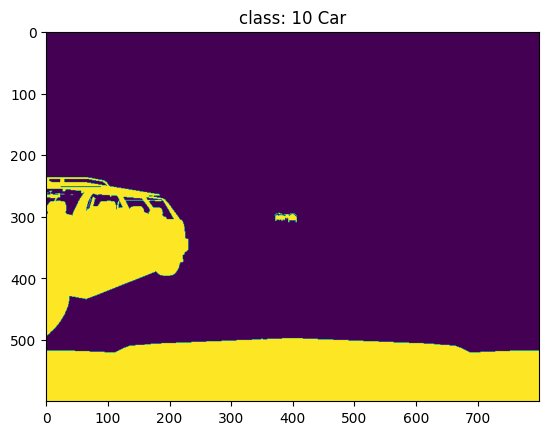

[  0 255]


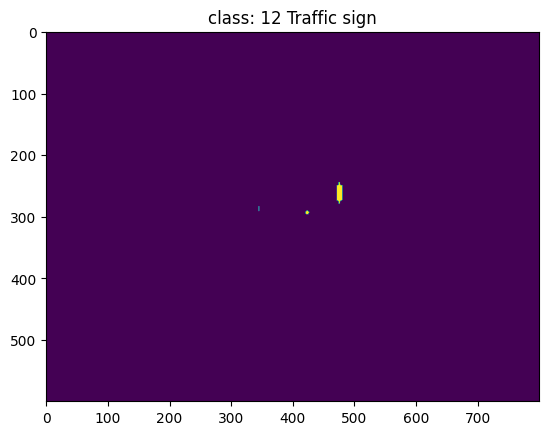

In [ ]:
labels = {
    0: 'Unlabeled',
    1: 'Building',
    2: 'Fence',
    3: 'Other',
    4: 'Pedestrian',
    5: 'Pole',
    6: 'Roadline',
    7: 'Road',
    8: 'Sidewalk',
    9: 'Vegetation',
    10: 'Car',
    11: 'Wall',
    12: 'Traffic sign'
}



img = '02_00_000'

masks_used = []
labels_used = [10, 12]
for i in labels_used:
    mask = plt.imread('./lyft_segmentation/segmentation_masks/{}.png'.format(img)) * 255
    mask = np.where(mask == i, 255, 0)
    mask = mask[:,:,0]
    print(np.unique(mask))
    plt.title(f'class: {i} {labels[i]}')
    plt.imshow(mask)
    plt.show()
    masks_used.append(mask)




In [ ]:
import torch
import numpy as np

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


mask = masks_used[0]
pred_mask = masks[2]
gt_mask_np = np.array(mask)


gt_mask_binary = (gt_mask_np > 0).astype(np.uint8)
gt_mask_tensor = torch.tensor(gt_mask_binary).unsqueeze(0).unsqueeze(0).to(device)
pred_mask_tensor = torch.tensor(pred_mask, dtype=torch.uint8).unsqueeze(0).unsqueeze(0).to(device)


if gt_mask_tensor.shape != pred_mask_tensor.shape:
    pred_mask_tensor = torch.nn.functional.interpolate(
        pred_mask_tensor.float(),
        size=gt_mask_tensor.shape[2:],
        mode='nearest'
    ).byte()


gt_mask_tensor = gt_mask_tensor.squeeze(0).squeeze(0)
pred_mask_tensor = pred_mask_tensor.squeeze(0).squeeze(0)

intersection = (pred_mask_tensor & gt_mask_tensor).sum()  # Пересечение
union = (pred_mask_tensor | gt_mask_tensor).sum()  # Объединение


true_positives = ((pred_mask_tensor == 1) & (gt_mask_tensor == 1)).sum()
false_negatives = ((pred_mask_tensor == 0) & (gt_mask_tensor == 1)).sum()


recall = true_positives / (true_positives + false_negatives) if (true_positives + false_negatives) > 0 else torch.tensor(0.0)
print(f'Recall: {recall.item():.4f}')


iou = intersection / union if union > 0 else torch.tensor(0.0)
print(f'IOU {labels[labels_used[0]]}: {iou.item():.4f}')


Recall: 0.3053
IOU Car: 0.2946


In [ ]:
import torch
import numpy as np

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


mask = masks_used[1]
pred_mask = masks[0]
gt_mask_np = np.array(mask)


gt_mask_binary = (gt_mask_np > 0).astype(np.uint8)
gt_mask_tensor = torch.tensor(gt_mask_binary).unsqueeze(0).unsqueeze(0).to(device)
pred_mask_tensor = torch.tensor(pred_mask, dtype=torch.uint8).unsqueeze(0).unsqueeze(0).to(device)


if gt_mask_tensor.shape != pred_mask_tensor.shape:
    pred_mask_tensor = torch.nn.functional.interpolate(
        pred_mask_tensor.float(),
        size=gt_mask_tensor.shape[2:],
        mode='nearest'
    ).byte()


gt_mask_tensor = gt_mask_tensor.squeeze(0).squeeze(0)
pred_mask_tensor = pred_mask_tensor.squeeze(0).squeeze(0)


intersection = (pred_mask_tensor & gt_mask_tensor).sum()
union = (pred_mask_tensor | gt_mask_tensor).sum()



true_positives = ((pred_mask_tensor == 1) & (gt_mask_tensor == 1)).sum()
false_negatives = ((pred_mask_tensor == 0) & (gt_mask_tensor == 1)).sum()


recall = true_positives / (true_positives + false_negatives) if (true_positives + false_negatives) > 0 else torch.tensor(0.0)
print(f'Recall: {recall.item():.4f}')


iou = intersection / union if union > 0 else torch.tensor(0.0)
print(f'IOU {labels[labels_used[1]]}: {iou.item():.4f}')


Recall: 0.7430
IOU Traffic sign: 0.5944


# Fine-tuning Yolo

In [ ]:
# Установка необходимых библиотек
!pip install ultralytics
!pip install pillow numpy pycocotools opencv-python


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 881.2/881.2 kB 24.5 MB/s eta 0:00:00


In [ ]:
import os

# Указание пути для создания папки labels
labels_dir = './lyft_segmentation/labels/'

# Создание папки, если она не существует
os.makedirs(labels_dir, exist_ok=True)

In [ ]:
from ultralytics.data.converter import convert_segment_masks_to_yolo_seg

# The classes here is the total classes in the dataset, for COCO dataset we have 80 classes
convert_segment_masks_to_yolo_seg(masks_dir="/content/lyft_segmentation/segmentation_masks", output_dir="/content/lyft_segmentation/labels", classes=13)

Выходные данные были обрезаны до нескольких последних строк (5000).
Processing /content/lyft_segmentation/segmentation_masks/F69-10.png imgsz = 600 x 800
Processed and stored at /content/lyft_segmentation/labels/F69-10.txt imgsz = 600 x 800
Processing /content/lyft_segmentation/segmentation_masks/03_00_220.png imgsz = 600 x 800
Processed and stored at /content/lyft_segmentation/labels/03_00_220.txt imgsz = 600 x 800
Processing /content/lyft_segmentation/segmentation_masks/10_00_047.png imgsz = 600 x 800
Processed and stored at /content/lyft_segmentation/labels/10_00_047.txt imgsz = 600 x 800
Processing /content/lyft_segmentation/segmentation_masks/F10-5.png imgsz = 600 x 800
Processed and stored at /content/lyft_segmentation/labels/F10-5.txt imgsz = 600 x 800
Processing /content/lyft_segmentation/segmentation_masks/F70-95.png imgsz = 600 x 800
Processed and stored at /content/lyft_segmentation/labels/F70-95.txt imgsz = 600 x 800
Processing /content/lyft_segmentation/segmentation_masks/

In [ ]:
# import os
# import cv2
# import numpy as np
# import glob
# from tqdm import tqdm
# import cv2

# # Путь к папке с масками сегментации и папке для аннотаций
# segmentation_masks_dir = './lyft_segmentation/segmentation_masks/'
# labels_dir = './lyft_segmentation/labels/'

# # Создание папки для аннотаций, если она не существует
# os.makedirs(labels_dir, exist_ok=True)

# # Получаем список всех масок сегментации
# mask_paths = glob.glob(os.path.join(segmentation_masks_dir, '*.png'))


# # Используем tqdm для отображения прогресса
# for mask_path in tqdm(mask_paths, desc="Обработка масок", unit="маска"):
#     # Загружаем сегментационную маску в одноканальном формате
#     img_seg = plt.imread(mask_path)
#     img_seg = img_seg[:, :, 0]

#     # Создаем список для аннотаций
#     annotations = []

#     img_seg = (img_seg * 255).astype(np.uint8)

#     # Получаем размеры изображения
#     img_height, img_width = img_seg.shape

#     # Перебираем все классы, кроме фона (предполагаем, что фон — класс 0)
#     for class_id in range(1, 13):
#         # Создаем бинарную маску для текущего класса
#         mask = np.where(img_seg == class_id, 1, 0).astype(np.uint8)
#         contours, _ = cv2.findContours(mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

#         # Проверяем, что контуры существуют
#         if contours:
#             # Находим bounding box для самого большого контура
#             x, y, w, h = cv2.boundingRect(max(contours, key=cv2.contourArea))

#             # Нормализуем координаты для YOLO
#             x1, y1 = x / img_width, y / img_height  # Левый верхний угол
#             x2, y2 = (x + w) / img_width, y / img_height  # Правый верхний угол
#             x3, y3 = (x + w) / img_width, (y + h) / img_height  # Правый нижний угол
#             x4, y4 = x / img_width, (y + h) / img_height  # Левый нижний угол

#         # Формируем строку для записи аннотации в формате YOLO
#         annotation_line = f"{class_id} {x1:.6f} {y1:.6f} {x2:.6f} {y2:.6f} {x3:.6f} {y3:.6f} {x4:.6f} {y4:.6f}"
#         annotations.append(annotation_line)

#     # Сохраняем аннотации в текстовый файл, если есть аннотации
#     if annotations:
#         output_filename = os.path.basename(mask_path).replace('.png', '.txt')
#         output_path = os.path.join(labels_dir, output_filename)

#         with open(output_path, 'w') as f:
#             f.write('\n'.join(annotations))

# print("Обработка всех масок завершена.")


Обработка масок: 100%|██████████| 5000/5000 [02:23<00:00, 34.82маска/s]

Обработка всех масок завершена.


In [ ]:
# уже выполнено и скачивается с гугл диска
import os
import cv2
import numpy as np
import glob
from tqdm import tqdm

# Путь к папке с масками сегментации и папке для аннотаций
segmentation_masks_dir = './lyft_segmentation/segmentation_masks/'
labels_dir = './lyft_segmentation/labels/'

# Создание папки для аннотаций, если она не существует
os.makedirs(labels_dir, exist_ok=True)

# Получаем список всех масок сегментации
mask_paths = glob.glob(os.path.join(segmentation_masks_dir, '*.png'))

# Используем tqdm для отображения прогресса
for mask_path in tqdm(mask_paths, desc="Обработка масок", unit="маска"):
    # Загружаем сегментационную маску в одноканальном формате
    img_seg = plt.imread(mask_path)
    img_seg = img_seg[:, :, 0]
    img_seg = (img_seg * 255).astype(np.uint8)

    # Создаем список для аннотаций
    annotations = []

    # Получаем размеры изображения
    # img_height, img_width = img_seg.shape
    img_height, img_width = 600, 800
    # Перебираем все классы, кроме фона (предполагаем, что фон — класс 0)
    # for class_id in [6]:
    class_id = 6  # Начинаем с 1, чтобы пропустить класс 0 (фон)
    # Создаем бинарную маску для текущего класса
    mask = np.where(img_seg == class_id, 1, 0).astype(np.uint8)
    coordinates = np.argwhere(mask == 1)

    if coordinates.size > 0:  # Проверяем, есть ли ненулевые пиксели
        # np.argwhere возвращает (y, x), поэтому мы транспонируем
        xy_coordinates = [(x, y) for y, x in coordinates]

        # Формируем строку для записи аннотации
        annotation_line = f"{'0'} " + " ".join([f"{x / img_width:.6f} {y / img_height:.6f}" for x, y in xy_coordinates])
        annotations.append(annotation_line)

    # Сохраняем аннотации в текстовый файл, если есть аннотации
    if annotations:
        output_filename = os.path.basename(mask_path).replace('.png', '.txt')
        output_path = os.path.join(labels_dir, output_filename)

        with open(output_path, 'w') as f:
            f.write('\n'.join(annotations))

print("Обработка всех масок завершена.")


Обработка масок: 100%|██████████| 5000/5000 [02:04<00:00, 40.26маска/s]

Обработка всех масок завершена.


In [ ]:
import shutil

# Сжимаем папку labels в zip-архив
shutil.make_archive('labels', 'zip', './lyft_segmentation/labels')

'/content/labels.zip'

In [ ]:
# from google.colab import drive
# from tqdm import tqdm
# import os
# import shutil

# # Подключаем Google Drive
# drive.mount('/content/drive')

# # Путь к вашему архиву
# archive_path = '/content/labels.zip'

# # Путь для сохранения на Google Диск
# google_drive_path = '/content/drive/MyDrive/labels.zip'

# # Копируем файл с отображением прогресса
# file_size = os.path.getsize(archive_path)
# chunk_size = 1024 * 1024  # 1MB

# with open(archive_path, 'rb') as src, open(google_drive_path, 'wb') as dst:
#     with tqdm(total=file_size, unit='B', unit_scale=True, desc="Копирование в Google Диск") as pbar:
#         while chunk := src.read(chunk_size):
#             dst.write(chunk)
#             pbar.update(len(chunk))

# print("Файл успешно скопирован на Google Диск!")



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Копирование в Google Диск: 100%|██████████| 1.83G/1.83G [00:11<00:00, 160MB/s]

Файл успешно скопирован на Google Диск!


In [ ]:
mask_path = '/content/lyft_segmentation/segmentation_masks/02_00_000.png'
img_seg = plt.imread(mask_path)
img_seg = img_seg[:, :, 0]
img_seg = (img_seg * 255).astype(np.uint8)
unique_classes = np.unique(img_seg)
counter = 0
print("Уникальные классы в изображении:", unique_classes)
img_height, img_width = 600, 800
for class_id in range(1, 13):  # Начинаем с 1, чтобы пропустить класс 0 (фон)
    # Создаем бинарную маску для текущего класса
    mask = np.where(img_seg == class_id, 1, 0).astype(np.uint8)
    coordinates = np.argwhere(mask == 1)

    if coordinates.size > 0:
        print(class_id)  # Проверяем, есть ли ненулевые пиксели
        # np.argwhere возвращает (y, x), поэтому мы транспонируем
        xy_coordinates = [(x, y) for y, x in coordinates]
# Формируем строку для записи аннотации
        annotation_line = f"{class_id} " + " ".join([f"{x / img_width:.6f} {y / img_height:.6f}" for x, y in xy_coordinates])
        print(annotation_line)
        counter +=1
        print(counter)


Уникальные классы в изображении: [ 0  1  2  3  5  6  7  8  9 10 11 12]
1
1 0.000000 0.000000 0.001250 0.000000 0.002500 0.000000 0.003750 0.000000 0.005000 0.000000 0.006250 0.000000 0.007500 0.000000 0.008750 0.000000 0.010000 0.000000 0.011250 0.000000 0.012500 0.000000 0.013750 0.000000 0.015000 0.000000 0.016250 0.000000 0.017500 0.000000 0.018750 0.000000 0.020000 0.000000 0.021250 0.000000 0.022500 0.000000 0.023750 0.000000 0.025000 0.000000 0.026250 0.000000 0.027500 0.000000 0.028750 0.000000 0.030000 0.000000 0.031250 0.000000 0.032500 0.000000 0.033750 0.000000 0.035000 0.000000 0.036250 0.000000 0.037500 0.000000 0.038750 0.000000 0.040000 0.000000 0.041250 0.000000 0.042500 0.000000 0.043750 0.000000 0.045000 0.000000 0.046250 0.000000 0.047500 0.000000 0.048750 0.000000 0.050000 0.000000 0.051250 0.000000 0.052500 0.000000 0.053750 0.000000 0.055000 0.000000 0.056250 0.000000 0.057500 0.000000 0.058750 0.000000 0.060000 0.000000 0.061250 0.000000 0.062500 0.000000 0.06375

In [ ]:
import os
import shutil
import numpy as np

# Укажите пути к вашим папкам
images_dir = '/content/lyft_segmentation/images'
labels_dir = '/content/lyft_segmentation/labels'

# Создайте папки для тренировочных и валидационных данных
train_images_dir = './lyft_segmentation/train/images'
train_labels_dir = './lyft_segmentation/train/labels'
val_images_dir = './lyft_segmentation/val/images'
val_labels_dir = './lyft_segmentation/val/labels'

# Создаем директории, если они не существуют
for directory in [train_images_dir, train_labels_dir, val_images_dir, val_labels_dir]:
    os.makedirs(directory, exist_ok=True)

# Получаем список файлов изображений
image_files = [f for f in os.listdir(images_dir) if f.endswith('.png')]

# Задаем размер валидационной выборки (например, 20% от общего числа файлов)
val_size = int(0.2 * len(image_files))
val_files = np.random.choice(image_files, size=val_size, replace=False)

# Разделяем файлы на тренировочные и валидационные
train_files = [f for f in image_files if f not in val_files]

# Функция для копирования изображений и аннотаций, если аннотация существует
def copy_files(files, image_dir, label_dir, target_image_dir, target_label_dir):
    for file in files:
        # Проверяем, существует ли аннотация для изображения
        label_file = file.replace('.png', '.txt')  # Предполагается, что аннотации имеют такое же имя
        label_path = os.path.join(label_dir, label_file)

        if os.path.exists(label_path):
            # Копируем изображение
            shutil.copy(os.path.join(image_dir, file), os.path.join(target_image_dir, file))
            # Копируем аннотацию
            shutil.copy(label_path, os.path.join(target_label_dir, label_file))
        else:
            print(f"Аннотация для {file} не найдена, файл пропущен.")

# Копируем валидационные файлы в соответствующие папки
copy_files(val_files, images_dir, labels_dir, val_images_dir, val_labels_dir)

# Копируем тренировочные файлы в соответствующие папки
copy_files(train_files, images_dir, labels_dir, train_images_dir, train_labels_dir)

print("Данные успешно разделены на тренировочную и валидационную выборки!")


Данные успешно разделены на тренировочную и валидационную выборки!


In [ ]:
# import os
# import shutil
# import numpy as np

# # Укажите пути к вашим папкам
# images_dir = './lyft_segmentation/images'
# masks_dir = './lyft_segmentation/segmentation_masks'
# labels_dir = './lyft_segmentation/labels'

# # Создайте папки для тренировочных и валидационных данных
# train_images_dir = './lyft_segmentation/train/images'
# train_labels_dir = './lyft_segmentation/train/labels'
# val_images_dir = './lyft_segmentation/val/images'
# val_labels_dir = './lyft_segmentation/val/labels'

# for directory in [train_images_dir, train_labels_dir, val_images_dir, val_labels_dir]:
#     os.makedirs(directory, exist_ok=True)

# # Получите список файлов изображений
# image_files = [f for f in os.listdir(images_dir) if f.endswith('.png')]

# # Задайте размер валидационной выборки (например, 20% от общего числа файлов)
# val_size = int(0.2 * len(image_files))
# val_files = np.random.choice(image_files, size=val_size, replace=False)

# # Разделите файлы на тренировочные и валидационные
# train_files = [f for f in image_files if f not in val_files]

# # Копируем валидационные файлы в соответствующие папки
# for file in val_files:
#     # Копируем изображение
#     shutil.copy(os.path.join(images_dir, file), os.path.join(val_images_dir, file))
#     # Копируем маску
#     mask_file = file.replace('.png', '.png')  # Предполагается, что маски имеют такое же имя
#     shutil.copy(os.path.join(masks_dir, mask_file), os.path.join(val_images_dir, mask_file))
#     # Копируем аннотацию
#     label_file = file.replace('.png', '.txt')  # Предполагается, что аннотации имеют такое же имя
#     shutil.copy(os.path.join(labels_dir, label_file), os.path.join(val_labels_dir, label_file))

# # Копируем тренировочные файлы в соответствующие папки
# for file in train_files:
#     # Копируем изображение
#     shutil.copy(os.path.join(images_dir, file), os.path.join(train_images_dir, file))
#     # Копируем маску
#     mask_file = file.replace('.png', '.png')  # Предполагается, что маски имеют такое же имя
#     shutil.copy(os.path.join(masks_dir, mask_file), os.path.join(train_images_dir, mask_file))
#     # Копируем аннотацию
#     label_file = file.replace('.png', '.txt')  # Предполагается, что аннотации имеют такое же имя
#     shutil.copy(os.path.join(labels_dir, label_file), os.path.join(train_labels_dir, label_file))

# print("Данные успешно разделены на тренировочную и валидационную выборки!")


Данные успешно разделены на тренировочную и валидационную выборки!


In [ ]:
yaml_content = """
# Ultralytics YOLO 🚀, AGPL-3.0 license
# Lyft Segmentation dataset
# Documentation: https://docs.ultralytics.com/datasets/segment/
# Example usage: yolo train data=lyft_dataset.yaml

# Train/val/test sets as 1) dir: path/to/imgs, 2) file: path/to/imgs.txt, or 3) list: [path/to/imgs1, path/to/imgs2, ..]
path: ../lyft_segmentation  # dataset root dir
train: train/images         # train images (relative to 'path')
val: val/images             # val images (relative to 'path')
test:                       # test images (optional)

# Classes
nc: 13
names:
  0: 'Unlabeled'
  1: 'Building'
  2: 'Fence'
  3: 'Other'
  4: 'Pedestrian'
  5: 'Pole'
  6: 'Roadline'
  7: 'Road'
  8: 'Sidewalk'
  9: 'Vegetation'
  10: 'Car'
  11: 'Wall'
  12: 'Traffic sign'
"""

# Используем utf-8 кодировку при записи файла
with open("/content/lyft_segmentation/lyft_dataset.yaml", "w", encoding="utf-8") as f:
    f.write(yaml_content)


In [ ]:
from ultralytics import YOLO
model = YOLO('yolo11s-seg.pt')

100%|██████████| 19.7M/19.7M [00:00<00:00, 87.7MB/s]


In [ ]:
!rm -rf lyft_segmentation/labels

In [ ]:
!rm -rf lyft_segmentation/train
!rm -rf lyft_segmentation/val

In [ ]:
import os
import random
from tqdm import tqdm

# Определяем пути к папкам
train_images_dir = '/content/lyft_segmentation/train/images'
train_labels_dir = '/content/lyft_segmentation/train/labels'
val_images_dir = '/content/lyft_segmentation/val/images'
val_labels_dir = '/content/lyft_segmentation/val/labels'

def delete_percent_of_pairs(images_dir, labels_dir, percent=20):
    """Удаляет случайный процент (по умолчанию 20%) пар файлов изображения и аннотации."""
    # Получаем общие имена файлов без расширения
    image_files = {os.path.splitext(f)[0] for f in os.listdir(images_dir)}
    label_files = {os.path.splitext(f)[0] for f in os.listdir(labels_dir)}
    common_files = list(image_files.intersection(label_files))

    # Выбираем случайные файлы для удаления на основе процента
    files_to_delete = random.sample(common_files, len(common_files) * percent // 100)

    for file_name in tqdm(files_to_delete, desc=f"Удаление пар из {images_dir} и {labels_dir}"):
        image_path = os.path.join(images_dir, file_name + '.png')
        label_path = os.path.join(labels_dir, file_name + '.txt')

        # Удаляем только если оба файла существуют
        if os.path.isfile(image_path) and os.path.isfile(label_path):
            os.remove(image_path)
            os.remove(label_path)

# Удаляем 20% файлов в папках train и val
delete_percent_of_pairs(train_images_dir, train_labels_dir, percent=20)
delete_percent_of_pairs(val_images_dir, val_labels_dir, percent=20)

print("Удаление 20% файлов завершено.")


Удаление пар из /content/lyft_segmentation/train/images и /content/lyft_segmentation/train/labels: 100%|██████████| 784/784 [00:00<00:00, 5587.78it/s]
Удаление пар из /content/lyft_segmentation/val/images и /content/lyft_segmentation/val/labels: 100%|██████████| 195/195 [00:00<00:00, 6473.51it/s]

Удаление 20% файлов завершено.


In [ ]:
!rm /content/lyft_segmentation/train/labels.cache
!rm /content/lyft_segmentation/val/labels.cache


NotImplementedError: A UTF-8 locale is required. Got ANSI_X3.4-1968

In [ ]:
import os
import shutil

# Пути к папкам с аннотациями и изображениями
labels_dir = '/content/lyft_segmentation/train/labels'
images_dir = '/content/lyft_segmentation/train/images'
incorrect_labels_dir = '/content/lyft_segmentation/train/labels_incorrect'

# Создаем директорию для файлов с ошибками, если она не существует
os.makedirs(incorrect_labels_dir, exist_ok=True)

# Функция для подсчета боксов и сегментов в аннотациях
def check_annotation_file(file_path):
    with open(file_path, 'r') as f:
        lines = f.readlines()
    # Считаем строки с боксами и сегментами
    num_boxes = sum(1 for line in lines if len(line.strip().split()) >= 5)
    num_segments = sum(1 for line in lines if len(line.strip().split()) > 5)
    return num_boxes, num_segments

# Список файлов с аннотациями
label_files = [f for f in os.listdir(labels_dir) if f.endswith('.txt')]

# Проход по каждому файлу и проверка на соответствие
for label_file in label_files:
    label_path = os.path.join(labels_dir, label_file)
    num_boxes, num_segments = check_annotation_file(label_path)

    # Если количество боксов и сегментов не совпадает, перемещаем файл
    if num_boxes != num_segments:
        print(f"Несоответствие в {label_file}: боксы = {num_boxes}, сегменты = {num_segments}")

        # Перемещение аннотации и соответствующего изображения в папку для ошибок
        shutil.move(label_path, os.path.join(incorrect_labels_dir, label_file))
        image_file = label_file.replace('.txt', '.png')
        if os.path.exists(os.path.join(images_dir, image_file)):
            shutil.move(os.path.join(images_dir, image_file), os.path.join(incorrect_labels_dir, image_file))

print("Проверка завершена. Несоответствующие аннотации перемещены в папку labels_incorrect.")


Проверка завершена. Несоответствующие аннотации перемещены в папку labels_incorrect.


In [ ]:
import os

# Путь к папке с несоответствующими аннотациями и изображениями
incorrect_labels_dir = '/content/lyft_segmentation/train/labels_incorrect'

# Удаление всех файлов в папке `labels_incorrect`
for file_name in os.listdir(incorrect_labels_dir):
    file_path = os.path.join(incorrect_labels_dir, file_name)
    try:
        os.remove(file_path)
        print(f"Удален файл: {file_name}")
    except Exception as e:
        print(f"Ошибка при удалении {file_name}: {e}")

print("Удаление завершено.")


Удаление завершено.


0.3197 на модели, которая не успела дообучиться


In [ ]:
# Train the model
results = model.train(data="/content/lyft_segmentation/lyft_dataset.yaml", epochs=200, save=True,  save_period=10, imgsz=[600, 800], amp=True, batch = 8)

Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=segment, mode=train, model=yolo11s-seg.pt, data=/content/lyft_segmentation/lyft_dataset.yaml, epochs=200, time=None, patience=100, batch=8, imgsz=[600, 800], save=True, save_period=10, cache=False, device=None, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=T

train: Scanning /content/lyft_segmentation/train/labels.cache... 4000 images, 0 backgrounds, 3758 corrupt: 100%|██████████| 4000/4000 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/lyft_segmentation/train/images/02_00_000.png: ignoring corrupt image/label: Label class 2 exceeds dataset class count 1. Possible class labels are 0-0
train: WARNING ⚠️ /content/lyft_segmentation/train/images/02_00_001.png: ignoring corrupt image/label: Label class 2 exceeds dataset class count 1. Possible class labels are 0-0
train: WARNING ⚠️ /content/lyft_segmentation/train/images/02_00_002.png: ignoring corrupt image/label: Label class 2 exceeds dataset class count 1. Possible class labels are 0-0
train: WARNING ⚠️ /content/lyft_segmentation/train/images/02_00_003.png: ignoring corrupt image/label: Label class 2 exceeds dataset class count 1. Possible class labels are 0-0
train: WARNING ⚠️ /content/lyft_segmentation/train/images/02_00_004.png: ignoring corrupt image/label: Label class 2 exceeds dataset class count 1. Possible class labels are 0-0
train: WARNING ⚠️ /content/lyft_segmentation/train/images/02_00_005.png: ignoring corrupt image/label: Label c


val: Scanning /content/lyft_segmentation/val/labels.cache... 1000 images, 0 backgrounds, 956 corrupt: 100%|██████████| 1000/1000 [00:00<?, ?it/s]

val: WARNING ⚠️ /content/lyft_segmentation/val/images/02_00_014.png: ignoring corrupt image/label: Label class 2 exceeds dataset class count 1. Possible class labels are 0-0
val: WARNING ⚠️ /content/lyft_segmentation/val/images/02_00_016.png: ignoring corrupt image/label: Label class 2 exceeds dataset class count 1. Possible class labels are 0-0
val: WARNING ⚠️ /content/lyft_segmentation/val/images/02_00_030.png: ignoring corrupt image/label: Label class 2 exceeds dataset class count 1. Possible class labels are 0-0
val: WARNING ⚠️ /content/lyft_segmentation/val/images/02_00_033.png: ignoring corrupt image/label: Label class 2 exceeds dataset class count 1. Possible class labels are 0-0
val: WARNING ⚠️ /content/lyft_segmentation/val/images/02_00_037.png: ignoring corrupt image/label: Label class 2 exceeds dataset class count 1. Possible class labels are 0-0
val: WARNING ⚠️ /content/lyft_segmentation/val/images/02_00_041.png: ignoring corrupt image/label: Label class 2 exceeds dataset c

Plotting labels to runs/segment/train4/labels.jpg... 

optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000588, momentum=0.9) with parameter groups 90 weight(decay=0.0), 101 weight(decay=0.0005), 100 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 800 train, 800 val
Using 2 dataloader workers
Logging results to runs/segment/train4
Starting training for 200 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      1/200         5G      1.062      2.628      1.738      1.171        285        800:  13%|█▎        | 4/31 [00:07<00:49,  1.82s/it]


RuntimeError: DataLoader worker (pid(s) 7779, 7780) exited unexpectedly


image 1/1 /content/lyft_segmentation/images/F61-63.png: 608x800 1 roadline, 94.6ms
Speed: 2.7ms preprocess, 94.6ms inference, 8.4ms postprocess per image at shape (1, 3, 608, 800)
Predicted mask shape: (1, 608, 800)
Predicted pixels for class 6: 0
No true pixels for class 6 in image /content/lyft_segmentation/images/F61-63.png, skipping IoU and F1.
Image: /content/lyft_segmentation/images/F61-63.png
No true pixels for class 6
No true pixels for class 6
----------


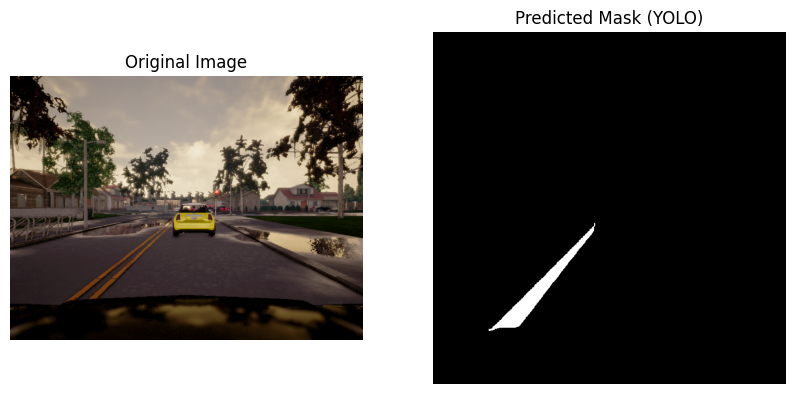


image 1/1 /content/lyft_segmentation/images/02_02_241.png: 608x800 1 roadline, 50.5ms
Speed: 2.7ms preprocess, 50.5ms inference, 4.7ms postprocess per image at shape (1, 3, 608, 800)
Predicted mask shape: (1, 608, 800)
Predicted pixels for class 6: 0
No true pixels for class 6 in image /content/lyft_segmentation/images/02_02_241.png, skipping IoU and F1.
Image: /content/lyft_segmentation/images/02_02_241.png
No true pixels for class 6
No true pixels for class 6
----------


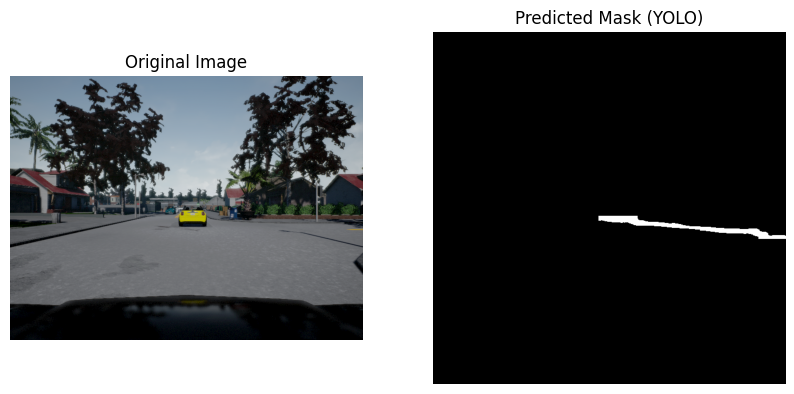


image 1/1 /content/lyft_segmentation/images/03_00_217.png: 608x800 1 roadline, 58.4ms
Speed: 2.6ms preprocess, 58.4ms inference, 5.9ms postprocess per image at shape (1, 3, 608, 800)
Predicted mask shape: (1, 608, 800)
Predicted pixels for class 6: 0
No true pixels for class 6 in image /content/lyft_segmentation/images/03_00_217.png, skipping IoU and F1.
Image: /content/lyft_segmentation/images/03_00_217.png
No true pixels for class 6
No true pixels for class 6
----------


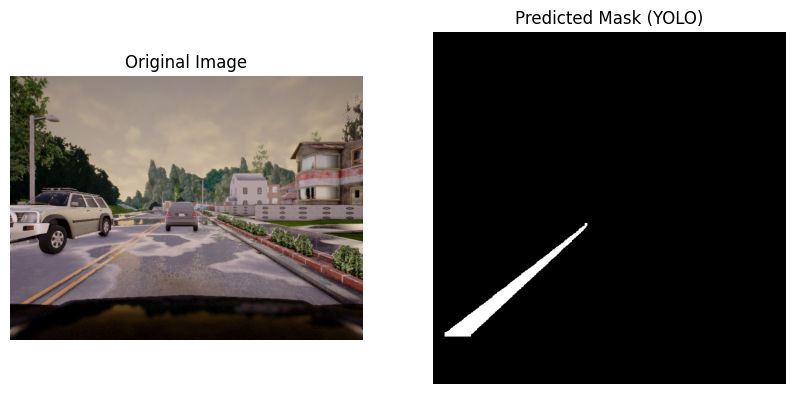


image 1/1 /content/lyft_segmentation/images/F61-71.png: 608x800 1 roadline, 63.9ms
Speed: 2.6ms preprocess, 63.9ms inference, 7.4ms postprocess per image at shape (1, 3, 608, 800)
Predicted mask shape: (1, 608, 800)
Predicted pixels for class 6: 0
No true pixels for class 6 in image /content/lyft_segmentation/images/F61-71.png, skipping IoU and F1.
Image: /content/lyft_segmentation/images/F61-71.png
No true pixels for class 6
No true pixels for class 6
----------


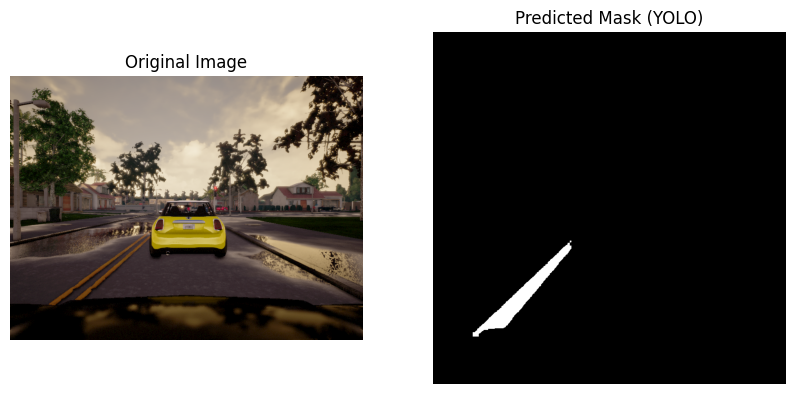


image 1/1 /content/lyft_segmentation/images/02_01_190.png: 608x800 1 roadline, 65.9ms
Speed: 6.0ms preprocess, 65.9ms inference, 5.9ms postprocess per image at shape (1, 3, 608, 800)
Predicted mask shape: (1, 608, 800)
Predicted pixels for class 6: 0
No true pixels for class 6 in image /content/lyft_segmentation/images/02_01_190.png, skipping IoU and F1.
Image: /content/lyft_segmentation/images/02_01_190.png
No true pixels for class 6
No true pixels for class 6
----------


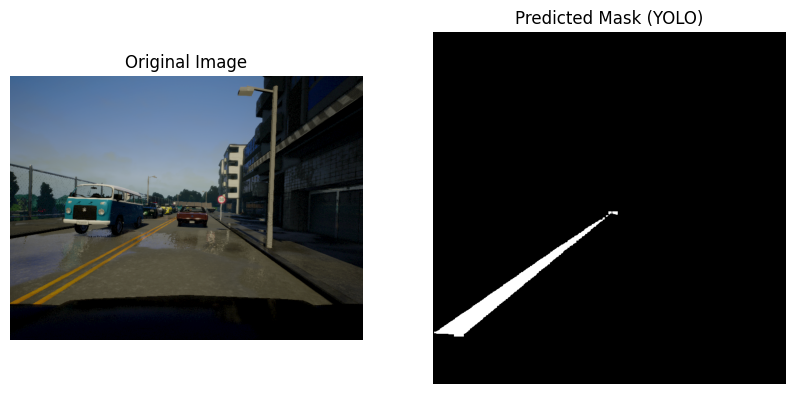

No valid IoU or F1 scores computed.


In [ ]:
import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from sklearn.metrics import jaccard_score, f1_score

# Путь к модели и папке с изображениями
model_path = "/content/runs/segment/train2/weights/best.pt"  # обученная модель
img_folder = "/content/lyft_segmentation/images"  # папка с изображениями
mask_folder = "/content/lyft_segmentation/segmentation_masks"  # папка с истинными масками

# Загрузка модели YOLOv8
model = YOLO(model_path)

# Получаем список файлов изображений в папке
images = [os.path.join(img_folder, img) for img in os.listdir(img_folder) if img.endswith(('.jpg', '.png'))]

# Выбираем 5 случайных изображений
random_images = random.sample(images, 5)

# Метрики
iou_scores = []
f1_scores = []

# Применяем сегментацию к каждому изображению и считаем метрики
for image_path in random_images:
    # Применяем сегментацию
    results = model.predict(image_path)
    pred_masks = np.array(results[0].masks.data.cpu())  # получаем предсказанные маски

    # Выводим размерность предсказанных масок
    print("Predicted mask shape:", pred_masks.shape)

    # Проверьте, есть ли вообще маски для класса 6
    pred_mask_class_6 = (pred_masks == 6).sum()
    print(f"Predicted pixels for class 6: {pred_mask_class_6}")

    # Загружаем истинную маску
    mask_path = os.path.join(mask_folder, f"{os.path.basename(image_path).split('.')[0]}.png")
    true_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    # Подготавливаем истинную маску для класса 6
    true_mask = np.where(true_mask == 6, 1, 0).astype(np.uint8)

    # Изменяем размер истинной маски до 640x640
    true_mask_resized = cv2.resize(true_mask, (640, 640), interpolation=cv2.INTER_NEAREST)

    # Убедимся, что размер предсказанной маски совпадает с размером истинной
    if pred_masks[0].shape != true_mask_resized.shape:
        pred_mask_resized = cv2.resize(pred_masks[0], (640, 640), interpolation=cv2.INTER_NEAREST)
    else:
        pred_mask_resized = pred_masks[0]

    # Метрика только для класса 6
    pred_mask_binary = (pred_mask_resized == 1).astype(np.uint8).flatten()
    true_mask_binary = true_mask_resized.flatten()

    # Вычисляем IoU и F1 Score для класса
    if np.sum(true_mask_binary) > 0:  # Если есть хоть один пиксель для класса 6 в истинной маске
        iou = jaccard_score(true_mask_binary, pred_mask_binary)
        f1 = f1_score(true_mask_binary, pred_mask_binary)
        iou_scores.append(iou)
        f1_scores.append(f1)
    else:
        print(f"No true pixels for class 6 in image {image_path}, skipping IoU and F1.")

    print(f"Image: {image_path}")
    print(f"IoU for class 6: {iou:.4f}" if np.sum(true_mask_binary) > 0 else "No true pixels for class 6")
    print(f"F1 Score for class 6: {f1:.4f}" if np.sum(true_mask_binary) > 0 else "No true pixels for class 6")
    print("----------")

    # Вывод изображения и предсказанной маски
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Конвертация в RGB

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(img_rgb)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(pred_mask_resized, cmap='gray')
    plt.title("Predicted Mask (YOLO)")
    plt.axis("off")

    plt.show()

# Средние значения метрик
if iou_scores and f1_scores:
    mean_iou = np.mean(iou_scores)
    mean_f1 = np.mean(f1_scores)
    print(f"Average IoU for class 6: {mean_iou:.4f}")
    print(f"Average F1 Score for class 6: {mean_f1:.4f}")
else:
    print("No valid IoU or F1 scores computed.")


In [ ]:
import cv2
import numpy as np
from ultralytics import YOLO
import matplotlib.pyplot as plt


model = YOLO(model_path)


image_path = '/content/lyft_segmentation/images/02_00_000.png'
mask_path = '/content/lyft_segmentation/segmentation_masks/02_00_000.png'
image = cv2.imread(image_path)
mask = plt.imread(mask_path) * 255
mask = np.where(mask == 6, 1, 0)
mask = mask[:,:,0]

image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
h_or, w_or = image.shape[:2]

image_resized = cv2.resize(image, (640, 640))

results = model(image)



0: 608x800 1 roadline, 66.8ms
Speed: 2.7ms preprocess, 66.8ms inference, 6.4ms postprocess per image at shape (1, 3, 608, 800)


In [ ]:
pred_mask = np.array(results[0].masks.data.cpu())
print("Predicted mask shape:", pred_mask.shape)
count_ones = np.sum(pred_masks == 1)
print(count_ones)

Predicted mask shape: (1, 608, 800)
8312


In [ ]:
# print(*mask)
count_ones = np.sum(mask == 1)
print(count_ones)

3920


In [ ]:
from sklearn.metrics import jaccard_score, f1_score, precision_score, recall_score
import numpy as np

# Пример бинарных масок
# true_mask — истинная бинарная маска
# pred_mask — предсказанная бинарная маска
true_mask = mask
true_mask = cv2.resize(true_mask, (800, 608), interpolation=cv2.INTER_NEAREST)
pred_mask = pred_mask

# Пример масок (поменяйте на свои данные)
# Если ваша маска состоит из 0 и 1, то можно сразу использовать их для расчета метрик
true_mask = np.array(true_mask).flatten()  # Плоская бинарная маска
pred_mask = np.array(pred_mask).flatten()  # Плоская бинарная маска

# Рассчитываем IoU
iou = jaccard_score(true_mask, pred_mask)

# Рассчитываем F1-Score
f1 = f1_score(true_mask, pred_mask)

# Рассчитываем Precision
precision = precision_score(true_mask, pred_mask)

# Рассчитываем Recall
recall = recall_score(true_mask, pred_mask)

# Выводим результаты
print(f"IoU: {iou:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")


IoU: 0.3629
F1 Score: 0.5326
Precision: 0.4240
Recall: 0.7158


In [ ]:
# Цвета для масок
import cv2
from google.colab.patches import cv2_imshow
colors = [
    (255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0), (0, 255, 255),
    (255, 0, 255), (192, 192, 192), (128, 128, 128), (128, 0, 0), (128, 128, 0),
    (0, 128, 0), (128, 0, 128), (0, 128, 128), (0, 0, 128), (72, 61, 139),
    (47, 79, 79), (47, 79, 47), (0, 206, 209), (148, 0, 211), (255, 20, 147)
]


# Наложение масок на изображение
for i, mask in enumerate(masks):
    color = colors[int(classes[i]) % len(colors)]


    mask_resized = cv2.resize(mask, (w_or, h_or))
    color_mask = np.zeros((h_or, w_or, 3), dtype=np.uint8)
    color_mask[mask_resized > 0] = color


    image = cv2.addWeighted(image, 1.0, color_mask, 0.5, 0)


    cv2_imshow(image)

NameError: name 'masks' is not defined

[  0 255]


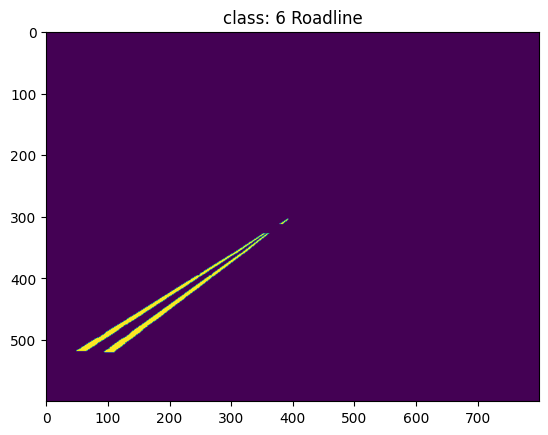

In [ ]:
labels = {
    0: 'Unlabeled',
    1: 'Building',
    2: 'Fence',
    3: 'Other',
    4: 'Pedestrian',
    5: 'Pole',
    6: 'Roadline',
    7: 'Road',
    8: 'Sidewalk',
    9: 'Vegetation',
    10: 'Car',
    11: 'Wall',
    12: 'Traffic sign'
}



img = '02_00_000'

masks_used = []
labels_used = [6]
for i in labels_used:
    mask = plt.imread('./lyft_segmentation/segmentation_masks/{}.png'.format(img)) * 255
    mask = np.where(mask == i, 255, 0)
    mask = mask[:,:,0]
    print(np.unique(mask))
    plt.title(f'class: {i} {labels[i]}')
    plt.imshow(mask)
    plt.show()
    masks_used.append(mask)




In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score
import numpy as np
import cv2  # Для изменения размера маски

def calculate_metrics(pred_mask, gt_mask):
    """
    Вычисление IoU, precision, recall и F1-score для предсказанной и эталонной масок.

    Args:
        pred_mask (np.array): Предсказанная маска, двоичная (1 - объект, 0 - фон).
        gt_mask (np.array): Эталонная маска, двоичная (1 - объект, 0 - фон).

    Returns:
        dict: Словарь с метриками IoU, precision, recall и F1-score.
    """
    pred_flat = pred_mask.flatten()
    gt_flat = gt_mask.flatten()

    intersection = np.logical_and(pred_flat, gt_flat).sum()
    union = np.logical_or(pred_flat, gt_flat).sum()
    iou = intersection / union if union != 0 else 0

    # Указываем average='macro' для многоклассового расчета метрик
    precision = precision_score(gt_flat, pred_flat, average='macro')
    recall = recall_score(gt_flat, pred_flat, average='macro')
    f1 = f1_score(gt_flat, pred_flat, average='macro')

    return {"IoU": iou, "Precision": precision, "Recall": recall, "F1-score": f1}

metrics_results = []

# Список классов для расчёта метрик
for class_id in [6, 7, 10, 12]:
    # Убедитесь, что в results есть данные для масок
    pred_mask = np.where(results.masks.data.cpu().numpy() == class_id, 1, 0).astype(np.uint8)

    # Находим эталонную маску для этого класса
    gt_mask = masks_used[labels_used.index(class_id)]

    # Изменяем размер маски, если нужно
    gt_mask_resized = cv2.resize(gt_mask, (640, 640), interpolation=cv2.INTER_NEAREST)
    pred_mask = pred_mask.squeeze()  # Удаляет размерность, если она равна 1
    assert pred_mask.shape == gt_mask_resized.shape, f"Размеры масок не совпадают: {pred_mask.shape} != {gt_mask_resized.shape}"

    # Рассчитываем метрики и добавляем результат
    metrics = calculate_metrics(pred_mask, gt_mask_resized)
    metrics_results.append((class_id, metrics))


    import matplotlib.pyplot as plt

    # Визуализируем маски для проверки
    plt.subplot(1, 2, 1)
    plt.title("Predicted Mask")
    plt.imshow(pred_mask, cmap='gray')
    plt.subplot(1, 2, 2)
    plt.title("Ground Truth Mask")
    plt.imshow(gt_mask_resized, cmap='gray')
    plt.show()

# Вывод метрик для каждого класса
for class_id, metrics in metrics_results:
    print(f"Class {class_id} - IoU: {metrics['IoU']:.4f}, Precision: {metrics['Precision']:.4f}, "
          f"Recall: {metrics['Recall']:.4f}, F1-score: {metrics['F1-score']:.4f}")


IndexError: index 3 is out of bounds for dimension 0 with size 1